In [1]:
import os
import sys
import torch
import numpy as np

In [2]:
IMAGE_SIZE = 512

In [3]:
import lovely_tensors as lt
lt.monkey_patch()

In [4]:
import os
import torch
import matplotlib.pyplot as plt

# Util function for loading meshes
from pytorch3d.io import load_objs_as_meshes, load_obj

# Data structures and functions for rendering
from pytorch3d.structures import Meshes
from pytorch3d.vis.plotly_vis import AxisArgs, plot_batch_individually, plot_scene
from pytorch3d.vis.texture_vis import texturesuv_image_matplotlib
from pytorch3d.renderer import (
    look_at_view_transform,
    FoVPerspectiveCameras, 
    PointLights, 
    DirectionalLights, 
    Materials, 
    RasterizationSettings, 
    MeshRenderer, 
    MeshRasterizer,  
    SoftPhongShader,
    TexturesUV,
    TexturesVertex
)

# add path for demo utils functions 
import sys
import os
sys.path.append(os.path.abspath(''))


# Setup
if torch.cuda.is_available():
    device = torch.device("cuda:0")
    torch.cuda.set_device(device)
else:
    device = torch.device("cpu")

# Set paths
DATA_DIR = "./meshes"
obj_filename = os.path.join(DATA_DIR, "cow_mesh/cow.obj")

# Load obj file
mesh = load_objs_as_meshes([obj_filename], device=device)

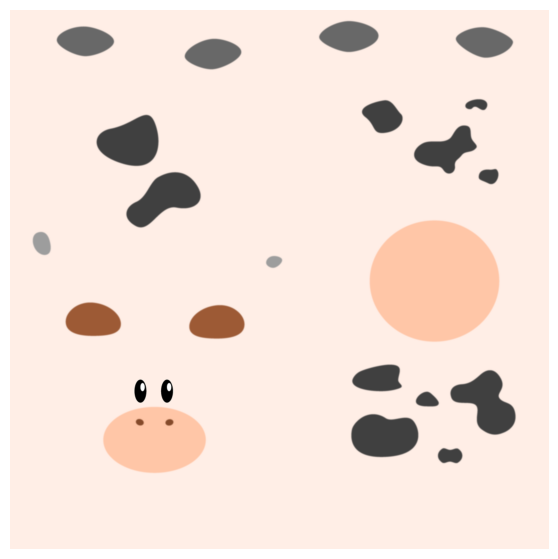

In [5]:
plt.figure(figsize=(7,7))
texture_image=mesh.textures.maps_padded()
plt.imshow(texture_image.squeeze().cpu().numpy());
plt.axis("off");

In [6]:
# plt.figure(figsize=(7,7))
# texturesuv_image_matplotlib(mesh.textures, subsample=None)
# plt.axis("off");

In [7]:
# Initialize a camera.
# With world coordinates +Y up, +X left and +Z in, the front of the cow is facing the -Z direction. 
# So we move the camera by 180 in the azimuth direction so it is facing the front of the cow. 
R, T = look_at_view_transform(3, 0, 180) 
cameras = FoVPerspectiveCameras(device=device, R=R, T=T)

# Define the settings for rasterization and shading. Here we set the output image to be of size
# 512x512. As we are rendering images for visualization purposes only we will set faces_per_pixel=1
# and blur_radius=0.0. We also set bin_size and max_faces_per_bin to None which ensure that 
# the faster coarse-to-fine rasterization method is used. Refer to rasterize_meshes.py for 
# explanations of these parameters. Refer to docs/notes/renderer.md for an explanation of 
# the difference between naive and coarse-to-fine rasterization. 
raster_settings = RasterizationSettings(
    image_size=IMAGE_SIZE, 
    blur_radius=0.0, 
    faces_per_pixel=1, 
)

# Place a point light in front of the object. As mentioned above, the front of the cow is facing the 
# -z direction. 
lights = PointLights(device=device, location=[[0.0, 0.0, -3.0]])

# Create a Phong renderer by composing a rasterizer and a shader. The textured Phong shader will 
# interpolate the texture uv coordinates for each vertex, sample from a texture image and 
# apply the Phong lighting model
renderer = MeshRenderer(
    rasterizer=MeshRasterizer(
        cameras=cameras, 
        raster_settings=raster_settings
    ),
    shader=SoftPhongShader(
        device=device, 
        cameras=cameras,
        lights=lights
    )
)

rasterizer=MeshRasterizer(
    cameras=cameras, 
    raster_settings=raster_settings
)

In [8]:
import sys
sys.path.append('/app')

from src.pytorch_cameras import generate_orbit, write_video

orbit_points, orbit_cameras = generate_orbit(N_FRAMES=200)
images = []
depths = []
masks = []
for cam in orbit_cameras:
    fragments = rasterizer(mesh, cameras=cam.to(device))
    depth = fragments.zbuf
    mask = (fragments.pix_to_face != -1).squeeze(0)
    img = renderer(mesh, cameras=cam.to(device))
    
    images.append(img[0, ..., :3])
    depths.append(depth[0, ..., :3])
    masks.append(mask)


In [10]:
sys.path.append('/app/submodules/Depth-Anything/metric_depth/')

import argparse
import os
import glob
import torch
import numpy as np
from PIL import Image
import torchvision.transforms as transforms
import open3d as o3d
from tqdm import tqdm
from zoedepth.models.builder import build_model
from zoedepth.utils.config import get_config

from dataclasses import dataclass
@dataclass
class Args:
    model: str = 'zoedepth'
    pretrained_resource: str = 'local::/app/checkpoints/depth-anything/depth_anything_metric_depth_indoor.pt'

DATASET = 'nyu'

args = Args()
config = get_config(args.model, "eval", DATASET)
config.pretrained_resource = args.pretrained_resource
model = build_model(config).to('cuda' if torch.cuda.is_available() else 'cpu')
model.eval();

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


xFormers not available
xFormers not available


Params passed to Resize transform:
	width:  518
	height:  392
	resize_target:  True
	keep_aspect_ratio:  False
	ensure_multiple_of:  14
	resize_method:  minimal
Using pretrained resource local::/app/checkpoints/depth-anything/depth_anything_metric_depth_indoor.pt
Loaded successfully


In [11]:
import torchvision.transforms as transforms
from PIL import Image

def img_to_pcd(img, depth=None, mask = None, focal=None, image_width=512, image_height=512, depth_model=None):
    if type(img) == torch.Tensor:
        img = img.squeeze().cpu().numpy()
    if focal is None:
        focal = image_width
        
    original_width, original_height = img.shape[:2]
    image_tensor = transforms.ToTensor()(img).unsqueeze(0).to('cuda' if torch.cuda.is_available() else 'cpu')

    if depth is None:
        if model is None:
            print('Pass depth estimation model!!!')

        depth = depth_model(image_tensor, dataset=DATASET)
        if isinstance(depth, dict):
            depth = depth.get('metric_depth', depth.get('out'))
        elif isinstance(pred, (list, tuple)):
            depth = depth[-1]

    depth = depth.squeeze().detach().cpu().numpy()

    resized_color_image = Image.fromarray(np.array(img*255., dtype=np.uint8)).resize((image_width, image_height), Image.LANCZOS)
    resized_depth = Image.fromarray(depth).resize((image_width, image_height), Image.NEAREST)

    focal_length_x, focal_length_y = focal / (np.array([original_width, original_height])/image_width)

    x, y = np.meshgrid(np.arange(image_width), np.arange(image_height))
    x = (image_width / 2 - x) / focal_length_x
    y = (image_height / 2 - y) / focal_length_y
    z = np.array(resized_depth)
    points = np.stack((np.multiply(x, z), np.multiply(y, z), z), axis=-1).reshape(-1, 3)
    colors = np.array(resized_color_image).reshape(-1, 3) / 255.0
    
    if mask is None:
        mask = np.sum(np.array(resized_depth).reshape(-1, 1), axis=-1) > 0.
    elif type(mask) == torch.Tensor:
        mask = mask.cpu().squeeze().numpy().reshape(-1)

    return points[mask], colors[mask], z

In [12]:
import math

Rs, Ts = [], [] 
points_world, points_color = [], []

skip = 50

for img, depth, mask, cam in zip(images[::skip], depths[::skip], masks[::skip], orbit_cameras[::skip]):
    focal = IMAGE_SIZE / (2 * math.tan(math.radians(cam.fov.item()) / 2))
    point_cam, point_color, pred_depth = img_to_pcd(img, depth=depth, mask=mask, focal=focal)

    c2w = cam.get_world_to_view_transform().inverse().get_matrix().squeeze().cpu()
    R_c2w, T_c2w = c2w[:3, :3], c2w[-1, :3].squeeze()
    

    point_world = (torch.tensor(point_cam, dtype=torch.float32) @ R_c2w + T_c2w).numpy()

    points_world.append(point_world)
    points_color.append(point_color)
    Rs.append(R_c2w)
    Ts.append(T_c2w)

points_world = np.concatenate(points_world, axis=0)
points_color = np.concatenate(points_color, axis=0)
Rs = torch.stack(Rs)
Ts = torch.stack(Ts)

In [13]:
focal

443.4050067376326

In [13]:
verts = mesh.verts_padded()[0].cpu().numpy()
colors = np.zeros((len(verts), 3))
colors[:, 0] = 1.

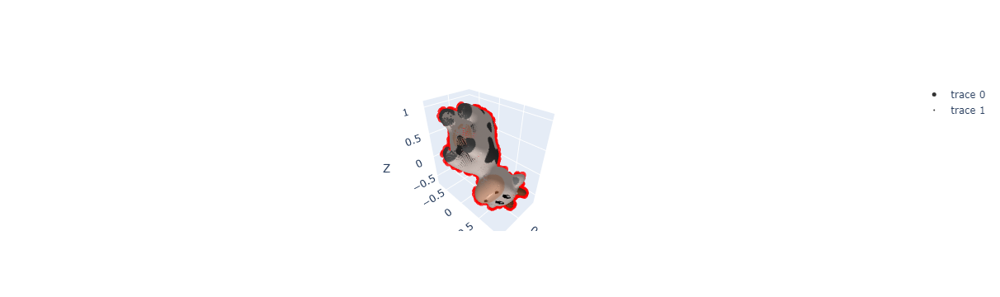

In [14]:
from src.visualizations import visualize_cameras, visualize_cameras_trajectorie, visualize_pcd

fig = visualize_pcd(verts, colors, skip=5, size=5, show=False);
fig = visualize_pcd(points_world, points_color, skip=5, fig=fig);

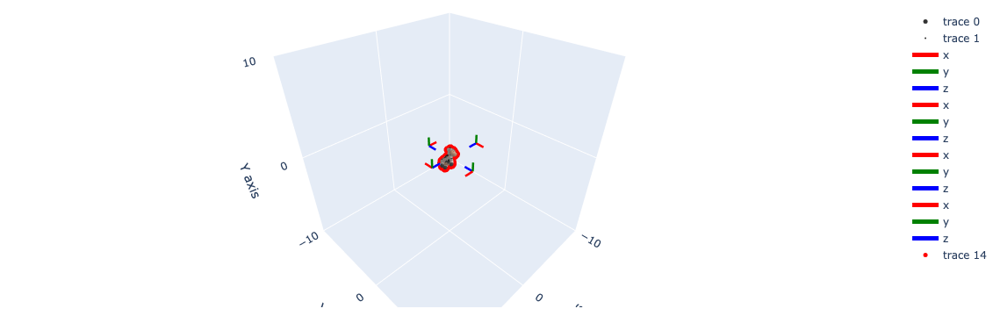

In [16]:
import sys, copy
sys.path.append('/app')
sys.path.append('/app/submodules')

from src.visualizations import visualize_cameras, visualize_cameras_trajectorie

visualize_cameras(Rs, Ts, copy.deepcopy(fig));

In [17]:
images[:2], depths[:2], masks[:2], orbit_cameras[:2]

([tensor[512, 512, 3] n=786432 (3Mb) x∈[0.104, 1.000] μ=0.930 σ=0.193 cuda:0,
  tensor[512, 512, 3] n=786432 (3Mb) x∈[0.104, 1.000] μ=0.932 σ=0.190 cuda:0],
 [tensor[512, 512, 1] n=262144 (1Mb) x∈[-1.000, 3.209] μ=-0.537 σ=1.226 cuda:0,
  tensor[512, 512, 1] n=262144 (1Mb) x∈[-1.000, 3.255] μ=-0.549 σ=1.224 cuda:0],
 [tensor[512, 512, 1] bool n=262144 (0.2Mb) x∈[False, True] μ=0.125 σ=0.330 cuda:0,
  tensor[512, 512, 1] bool n=262144 (0.2Mb) x∈[False, True] μ=0.119 σ=0.324 cuda:0],
 [FoVPerspectiveCameras(), FoVPerspectiveCameras()])

In [37]:
import json

def write_file(name, content, mode="w"):
    with open(name, mode) as file:
        file.write(content)

def read_file(name):
    with open(name, "r") as file:
        return file.read()

def read_json(name):
    content = read_file(name)
    obj = json.loads(content)
    return obj

def write_json(name, content):
    content = json.dumps(content)
    write_file(name, content)

In [38]:
from pathlib import Path


DATASETS_DIR = Path('/app/data/custom_datasets/')
CUSTOM_DATASET_NAME = 'cow_synthetic_gtdepth'

CUSTOM_DATASET_DIR = DATASETS_DIR / CUSTOM_DATASET_NAME
CUSTOM_DATASET_DIR.mkdir(parents=True, exist_ok=True)

! rm -rf {CUSTOM_DATASET_DIR}/*

CUSTOM_DATASET_DEPTH = CUSTOM_DATASET_DIR / 'depth'
CUSTOM_DATASET_IMAGES = CUSTOM_DATASET_DIR / 'images'
CUSTOM_DATASET_MASKS = CUSTOM_DATASET_DIR / 'masks'
CUSTOM_DATASET_DEPTH.mkdir(parents=True, exist_ok=True)
CUSTOM_DATASET_IMAGES.mkdir(parents=True, exist_ok=True)
CUSTOM_DATASET_MASKS.mkdir(parents=True, exist_ok=True)

In [40]:
from PIL import Image
import math

def create_transform_matrix(R, T):
    # Create the world-to-camera transform matrix
    w2c = np.eye(4)
    w2c[:3, :3] = np.transpose(R)  # Apply the inverse of the transpose operation
    w2c[:3, 3] = T.reshape(-1)
    
    # Convert this to a camera-to-world transform
    c2w = np.linalg.inv(w2c)
    
    # Apply the inverse of the axis change (revert the Y and Z axes back)
    # c2w[:3, 1:3] *= -1
    
    c2w[:3, 2:3] *= -1
    c2w[:3, :1] *= -1
    
    return c2w.astype(float).tolist()


fov = math.radians(orbit_cameras[0].fov.item())
camera_angle_x = fov

transforms = {
    "camera_angle_x": camera_angle_x,
    "frames": []
}


for idx, (img, depth, mask, cam) in tqdm(enumerate(zip(images, depths, masks, orbit_cameras))):
    R, T = cam.R.cpu().squeeze().numpy(), cam.T.cpu().squeeze().numpy()
    rotation = math.atan2(R[2][0], R[0][0])
    # save depth
    depth = depth.cpu().numpy()
    depth_path = str(CUSTOM_DATASET_DEPTH / f"{idx:05}.npy")
    np.save(depth_path, depth)
    # save mask
    mask = mask.cpu().numpy()
    mask_path = str(CUSTOM_DATASET_MASKS / f"{idx:05}.npy")
    np.save(mask_path, mask)
    # save image
    img = img.mul(255).to(torch.uint8).cpu().numpy()
    image_path = str(CUSTOM_DATASET_IMAGES / f"{idx:05}.png")
    Image.fromarray(img).save(image_path)

    # save frame
    transform_matrix = create_transform_matrix(R, T)
    transforms["frames"].append({
        "image_path": image_path,
        "mask_path": mask_path,
        "depth_path": depth_path,
        "rotation": rotation,
        "transform_matrix": transform_matrix
    })

write_json(CUSTOM_DATASET_DIR / f"transforms_train.json", transforms) 

200it [00:03, 50.63it/s]
